In [1]:
import os, sys
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import anndata
import pyreadr
from scipy.stats import spearmanr, pearsonr
import tangram as tg

from celltype_mapping import TangramMapping

In [2]:
def abline(slope, intercept, ax, args=None):
    """Plot a line from slope and intercept"""
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, **args)

In [3]:
data_path = 'C:\\Users\stephanies\data'

sp_anndata_file = data_path + '/BGI_data/903TR_C4/sp_anndata.h5ad'
sc_anndata_file = data_path + '/human_sc/ad_sc_human_MTG_great_ape.h5ad'

mapping_path = data_path + '/BGI_data/903TR_C4/mapping'

In [4]:
ad_sc_sea_ad = anndata.read_h5ad(data_path + '/human/ad_sc_human_MTG_SEA-AD.h5ad')

In [113]:
tg_map = TangramMapping(
    sc_data = sc_anndata_file,
    sp_data = sp_anndata_file,
    meta = {
        'stereoseq UID': '903TR_C4'
    }
)

In [163]:
tg_map.ad_sc.obs[['class_label', 'neighborhood_label', 'subclass_label', 'cluster_label', 'cluster_color']]

,class_label,neighborhood_label,subclass_label,cluster_label,cluster_color
sample_id,,,,,
CATGCTCGTCCAGCGT-6LKTX_191204_01_F01,glia,glia,Micro-PVM,Micro-PVM_1,#B5C8B7
TAGCACACAGGCGTTC-11LKTX_191204_02_C01,glia,glia,Micro-PVM,Micro-PVM_1,#B5C8B7
GGCTTGGCATACACCA-1LKTX_191204_01_A01,glia,glia,Micro-PVM,Micro-PVM_1,#B5C8B7
TGTGAGTCAGACCTAT-10LKTX_191204_02_B01,glia,glia,Micro-PVM,Micro-PVM_1,#B5C8B7
AATTCCTCAATTGCTG-35L8TX_191126_02_H02,glia,glia,Micro-PVM,Micro-PVM_1,#B5C8B7
...,...,...,...,...,...
TGACAGTTCTGGGCGT-9LKTX_191204_02_A01,inh,lamp5_sncg_vip,Sncg,Sncg_7,#BE5FD9
GCTCAAACATCGATAC-5LKTX_191204_01_E01,inh,lamp5_sncg_vip,Sncg,Sncg_7,#BE5FD9
GCACGGTGTTGTTGCA-32L8TX_191126_01_G01,inh,lamp5_sncg_vip,Sncg,Sncg_7,#BE5FD9


In [186]:
tg_map.ad_sc.obs.rename(columns={
    'class_label': 'class',
    'neighborhood_label': 'neighborhood',
    'subclass_label': 'subclass', 
    'cluster_label': 'cluster'
}, inplace=True)

tg_map.ad_sc.obs[['class', 'neighborhood', 'subclass', 'cluster']]

,class,neighborhood,subclass,cluster
sample_id,,,,
CATGCTCGTCCAGCGT-6LKTX_191204_01_F01,glia,glia,Micro-PVM,Micro-PVM_1
TAGCACACAGGCGTTC-11LKTX_191204_02_C01,glia,glia,Micro-PVM,Micro-PVM_1
GGCTTGGCATACACCA-1LKTX_191204_01_A01,glia,glia,Micro-PVM,Micro-PVM_1
TGTGAGTCAGACCTAT-10LKTX_191204_02_B01,glia,glia,Micro-PVM,Micro-PVM_1
AATTCCTCAATTGCTG-35L8TX_191126_02_H02,glia,glia,Micro-PVM,Micro-PVM_1
...,...,...,...,...
TGACAGTTCTGGGCGT-9LKTX_191204_02_A01,inh,lamp5_sncg_vip,Sncg,Sncg_7
GCTCAAACATCGATAC-5LKTX_191204_01_E01,inh,lamp5_sncg_vip,Sncg,Sncg_7
GCACGGTGTTGTTGCA-32L8TX_191126_01_G01,inh,lamp5_sncg_vip,Sncg,Sncg_7


In [180]:
human_labels = {}

for cls in ['exc', 'inh', 'glia']:
    neighborhoods = tg_map.ad_sc.obs[tg_map.ad_sc.obs['clas'] == cls]['neighborhood'].unique().to_list()
    human_labels[cls] = {}
    for neighborhood in neighborhoods:
        subclasses = tg_map.ad_sc.obs[tg_map.ad_sc.obs['neighborhood'] == neighborhood]['subclass'].unique().to_list()
        human_labels[cls][neighborhood] = {}
        for subclass in subclasses:
            clusters = tg_map.ad_sc.obs[tg_map.ad_sc.obs['subclass']== subclass]['cluster'].unique().to_list()
            human_labels[cls][neighborhood][subclass] = clusters

subclasses = tg_map.ad_sc.obs['subclass'].unique().to_list()
human_labels['subclass'] = {sc: tg_map.ad_sc.obs[tg_map.ad_sc.obs['subclass']==sc]['subclass_color'].unique()[0] for sc in subclasses}
clusters = tg_map.ad_sc.obs['cluster'].unique().to_list()
human_labels['cluster'] = {cl: tg_map.ad_sc.obs[tg_map.ad_sc.obs['cluster']==cl]['cluster_color'].unique()[0] for cl in clusters}
tg_map.ordered_labels.update(human_labels)

In [55]:
neuron_marker_genes = pd.read_csv(data_path + '/human/human_cluster_roc_markers.csv')
print(len(neuron_marker_genes))
glia_marker_genes = pd.read_csv(data_path + '/human/human_glia_roc_markers.csv')
print(len(glia_marker_genes))
marker_genes_df = neuron_marker_genes.append(glia_marker_genes)
marker_genes = marker_genes_df['gene'].to_list()
len(marker_genes)

14700
6721


21421

In [118]:
marker_genes_df.head()

,Unnamed: 0,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene,avg_log2FC
0,NPSR1-AS1,0.979,4.193076,0.958,4.193076,0.986,0.138,L5/6 NP_2,NPSR1-AS1,NaN
1,KIAA1456,0.965,8.806854,0.930,8.806854,1.000,0.697,L5/6 NP_2,KIAA1456,NaN
2,LOC105369818,0.958,15.499852,0.916,15.499852,0.938,0.064,L5/6 NP_2,LOC105369818,NaN
3,CDH6,0.953,5.515356,0.906,5.515356,0.992,0.286,L5/6 NP_2,CDH6,NaN
4,RANBP17,0.939,7.135565,0.878,7.135565,1.000,0.732,L5/6 NP_2,RANBP17,NaN


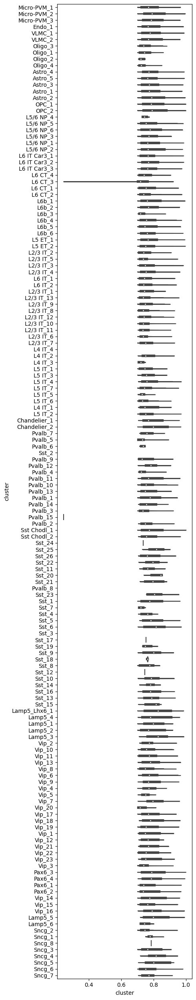

In [181]:
fig, ax = plt.subplots(figsize=(5, 25))
sns.violinplot(data=marker_genes_df, y='cluster', x='myAUC', ax=ax, cut=0, lw=0, order=tg_map.ordered_labels['cluster'])
# ax.tick_params(axis='y', labelrotation = 45)
ax.set_xlabel('cluster')
plt.tight_layout()

In [56]:
marker_medians = marker_genes_df.groupby('cluster').median()
marker_medians.head()

,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,avg_log2FC
cluster,,,,,,,
Astro_1,0.7725,0.734483,0.545,NaN,0.833,0.2330,1.059636
Astro_2,0.7890,0.901245,0.578,NaN,0.773,0.1515,1.300222
Astro_3,0.7720,0.909638,0.544,NaN,0.765,0.2160,1.312330
Astro_4,0.7700,0.880781,0.540,NaN,0.780,0.2265,1.270698
Astro_5,0.7630,0.814392,0.526,NaN,0.793,0.2410,1.174919


In [57]:
marker_genes_reduced = None
for cluster in marker_genes_df['cluster'].unique():
    thresh = marker_medians.loc[cluster]['myAUC']
    gene_filter = marker_genes_df[(marker_genes_df['cluster']==cluster) & (marker_genes_df['myAUC']>thresh)]
    if marker_genes_reduced is None:
        marker_genes_reduced = gene_filter
    else:
        marker_genes_reduced = marker_genes_reduced.append(gene_filter)
print(len(marker_genes_reduced))
marker_genes_reduced.head()

10613


,Unnamed: 0,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene,avg_log2FC
0,NPSR1-AS1,0.979,4.193076,0.958,4.193076,0.986,0.138,L5/6 NP_2,NPSR1-AS1,NaN
1,KIAA1456,0.965,8.806854,0.930,8.806854,1.000,0.697,L5/6 NP_2,KIAA1456,NaN
2,LOC105369818,0.958,15.499852,0.916,15.499852,0.938,0.064,L5/6 NP_2,LOC105369818,NaN
3,CDH6,0.953,5.515356,0.906,5.515356,0.992,0.286,L5/6 NP_2,CDH6,NaN
4,RANBP17,0.939,7.135565,0.878,7.135565,1.000,0.732,L5/6 NP_2,RANBP17,NaN


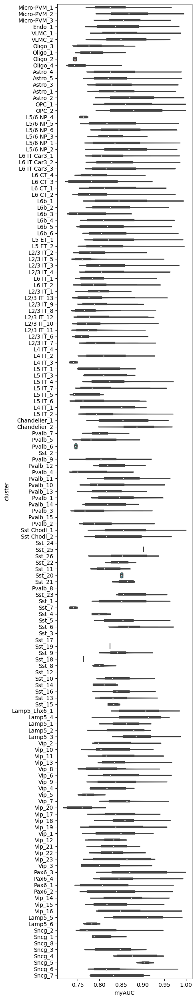

In [182]:
fig, ax = plt.subplots(figsize=(5, 25))
sns.violinplot(data=marker_genes_reduced, y='cluster', x='myAUC', ax=ax, cut=0, order=tg_map.ordered_labels['cluster'])
# ax.tick_params(axis='x', labelrotation = 45)
plt.tight_layout()

In [10]:
sea_ad_genes = [g for g in ad_sc_sea_ad.var_names if g not in marker_genes_reduced['gene'].to_list()]
print(len(sea_ad_genes))

11


In [293]:
marker_genes = marker_genes_reduced['gene'].to_list() + sea_ad_genes
tg_map.set_training_genes(marker_genes, meta={'training_genes': 'cluster ROC marker genes above median'})

starting with 10624 training genes..


INFO:root:4620 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:18673 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [58]:
training_genes = [g.upper() for g in tg_map.ad_sc.uns['training_genes']]
marker_genes_reduced['training_gene'] = marker_genes_reduced.apply(lambda x: x['gene'] in (training_genes), axis=1)
marker_genes_reduced.head()

,Unnamed: 0,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene,avg_log2FC,training_gene
0,NPSR1-AS1,0.979,4.193076,0.958,4.193076,0.986,0.138,L5/6 NP_2,NPSR1-AS1,NaN,False
1,KIAA1456,0.965,8.806854,0.930,8.806854,1.000,0.697,L5/6 NP_2,KIAA1456,NaN,False
2,LOC105369818,0.958,15.499852,0.916,15.499852,0.938,0.064,L5/6 NP_2,LOC105369818,NaN,False
3,CDH6,0.953,5.515356,0.906,5.515356,0.992,0.286,L5/6 NP_2,CDH6,NaN,True
4,RANBP17,0.939,7.135565,0.878,7.135565,1.000,0.732,L5/6 NP_2,RANBP17,NaN,True


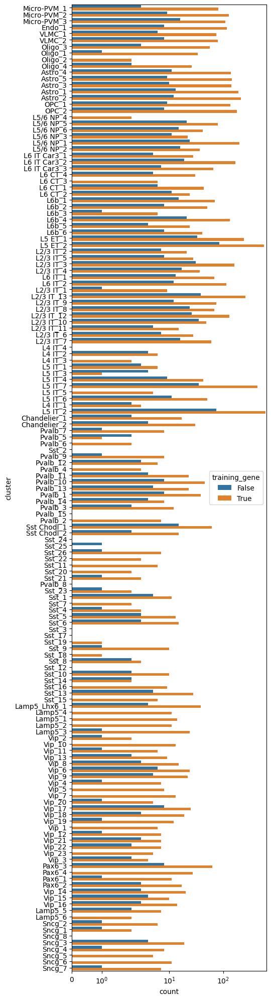

In [183]:
fig, ax = plt.subplots(figsize=(5, 25))
sns.countplot(data=marker_genes_reduced, y='cluster', hue='training_gene', ax=ax, order=tg_map.ordered_labels['cluster'])
ax.set_xscale('symlog')

In [221]:
training_gene_exp = pd.DataFrame(tg_map.ad_sc[:, tg_map.ad_sc.uns['training_genes']].to_df().mean(), columns=['snRNAseq'])
training_gene_exp = training_gene_exp.merge(pd.DataFrame(tg_map.ad_sp[:, tg_map.ad_sp.uns['training_genes']].to_df().mean(), columns=['stereoseq']),
                                           left_index=True, right_index=True)
training_gene_exp['ratio'] = training_gene_exp.apply(lambda x: x['stereoseq'] / x['snRNAseq'], axis=1)
training_gene_exp.head()

,snRNAseq,stereoseq,ratio
thy1,2.457330,0.720654,0.293267
jph3,0.956583,0.163016,0.170415
znf148,3.235677,0.079937,0.024705
col12a1,1.244092,0.019416,0.015606
cdk17,1.759702,0.138419,0.078660


In [222]:
training_gene_exp.describe()

,snRNAseq,stereoseq,ratio
count,4620.000000,4620.000000,4620.000000
mean,2.472922,0.107071,0.108818
std,13.043447,0.197925,0.200504
min,0.002044,0.000023,0.000130
25%,0.396215,0.021338,0.024177
50%,0.984990,0.052725,0.046309
75%,2.249757,0.117508,0.108763
max,814.395264,5.717887,3.573188


In [12]:
training_gene_exp['sea_ad'] = training_gene_exp.apply(lambda x: True if x.name.upper() in ad_sc_sea_ad.var_names else False, axis=1)

In [68]:
for col in training_gene_exp.columns:
    training_gene_exp[col + ' log'] = np.log(training_gene_exp[col])

In [69]:
training_gene_exp.corr()

,snRNAseq,stereoseq,sea_ad,snRNAseq log,stereoseq log,sea_ad log
snRNAseq,1.000000,0.204248,0.081502,0.291728,0.173205,NaN
stereoseq,0.204248,1.000000,0.002803,0.345730,0.620043,NaN
sea_ad,0.081502,0.002803,1.000000,0.103701,0.016771,NaN
snRNAseq log,0.291728,0.345730,0.103701,1.000000,0.674644,NaN
stereoseq log,0.173205,0.620043,0.016771,0.674644,1.000000,NaN
sea_ad log,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
training_gene_exp[training_gene_exp['sea_ad']==False].corr(method='spearman')

,snRNAseq,stereoseq,sea_ad
snRNAseq,1.000000,0.640155,NaN
stereoseq,0.640155,1.000000,NaN
sea_ad,NaN,NaN,NaN


In [53]:
training_gene_exp[training_gene_exp['sea_ad']==True].corr(method='spearman')

,snRNAseq,stereoseq,sea_ad
snRNAseq,1.000000,0.866149,NaN
stereoseq,0.866149,1.000000,NaN
sea_ad,NaN,NaN,NaN


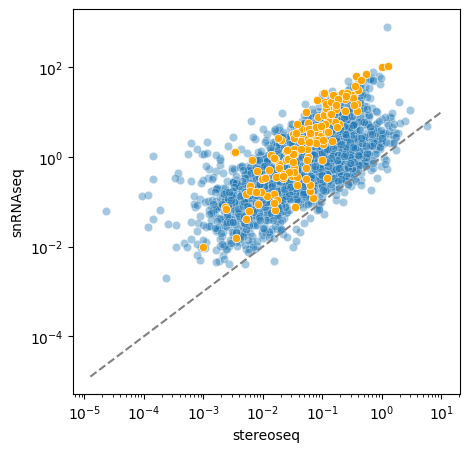

In [19]:
fig, ax = plt.subplots(figsize=(5,5))
sns.scatterplot(data=training_gene_exp[training_gene_exp['sea_ad']==False], y='snRNAseq', x='stereoseq', alpha=0.4)
sns.scatterplot(data=training_gene_exp[training_gene_exp['sea_ad']==True], y='snRNAseq', x='stereoseq',color='orange')
ax.set_yscale('log')
ax.set_xscale('log')
abline(1, 0, ax=ax, args={'ls':'--', 'c': 'grey'})
# ax.set_ylim(1e-3, 1e3)

In [47]:
ad_sp_marker_genes = tg_map.ad_sp[:, tg_map.ad_sc.uns['training_genes']]
tg_map.ad_sp.obs['n_tg_transcripts'] = np.array(ad_sp_marker_genes.X.sum(axis=1))
tg_map.ad_sp.obs['n_tg_genes'] = np.array(np.count_nonzero(ad_sp_marker_genes.X, axis=1))
tg_map.ad_sp.obs

,x,y,n_spots,n_transcripts,n_genes,uniform_density,rna_count_based_density,n_tg_transcripts,n_tg_genes
261,7626.802246,4729.047363,110.0,253.0,193.0,0.000023,0.000006,135.0,102
285,8150.893555,4739.859375,131.0,413.0,280.0,0.000023,0.000009,210.0,141
300,7991.510742,4756.812012,111.0,229.0,180.0,0.000023,0.000005,99.0,83
340,7678.530762,4777.556152,110.0,277.0,206.0,0.000023,0.000006,122.0,96
438,8017.916504,4881.809082,128.0,288.0,225.0,0.000023,0.000007,155.0,127
...,...,...,...,...,...,...,...,...,...
49570,9634.883789,24505.720703,133.0,412.0,277.0,0.000023,0.000009,176.0,130
49572,11042.689453,24500.250000,115.0,232.0,152.0,0.000023,0.000005,118.0,78
49581,11139.636719,24518.414062,128.0,292.0,182.0,0.000023,0.000007,143.0,96
49587,11790.439453,24534.582031,116.0,289.0,179.0,0.000023,0.000007,110.0,75


<AxesSubplot: xlabel='variable', ylabel='value'>

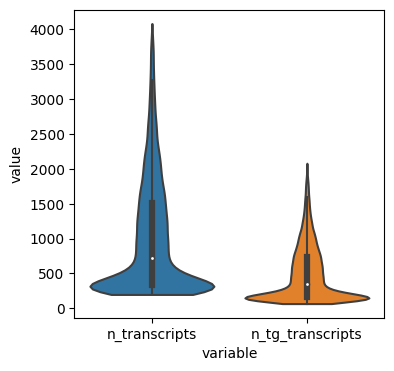

In [50]:
fig, ax = plt.subplots(figsize=(4,4))
sns.violinplot(data=tg_map.ad_sp.obs[['n_transcripts', 'n_tg_transcripts']].melt(), x='variable',
              y='value', cut=0, scale='width')

In [64]:
tg_map.ad_sp.obs[['n_transcripts', 'n_tg_transcripts']].describe()

,n_transcripts,n_tg_transcripts
count,42646.000000,42646.000000
mean,1021.026263,494.668579
std,823.491098,399.450195
min,200.000000,69.000000
25%,342.000000,165.000000
50%,727.000000,353.000000
75%,1516.000000,737.000000
max,4079.000000,2079.000000


In [295]:
tg_map.mapping(cluster_label='cluster')
tg_map.save_mapping(save_path=mapping_path)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 4620 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.179, KL reg: 0.305
Score: 0.252, KL reg: 0.000
Score: 0.256, KL reg: 0.000
Score: 0.258, KL reg: 0.000
Score: 0.258, KL reg: 0.000
Score: 0.259, KL reg: 0.000
Score: 0.259, KL reg: 0.000
Score: 0.259, KL reg: 0.000
Score: 0.259, KL reg: 0.000
Score: 0.259, KL reg: 0.000


INFO:root:Saving results..


analysis UID: 1675737007.572


In [296]:
tg_map.meta

{'stereoseq UID': '903TR_C4',
 'training_genes': 'cluster ROC marker genes above median + SEA AD gene panel',
 'mode': 'clusters',
 'cluster_label': 'cluster'}

In [4]:
tg_map = TangramMapping.load_from_timestamp(directory=mapping_path, timestamp='1675737007.572')
print(tg_map.meta)

{'stereoseq UID': '903TR_C4', 'training_genes': 'cluster ROC marker genes above median + SEA AD gene panel', 'mode': 'clusters', 'cluster_label': 'cluster'}


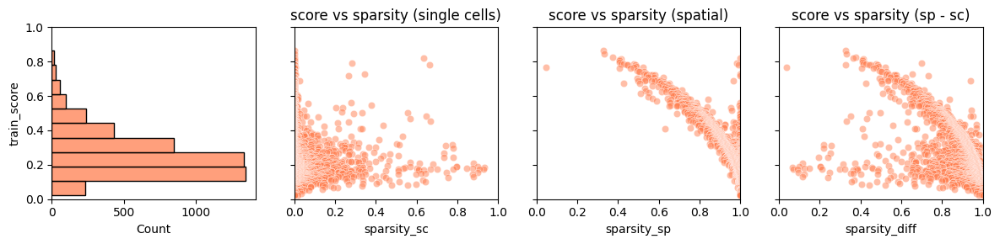

In [306]:
tg.plot_training_scores(tg_map.ad_map, bins=10, alpha=.5)

           score  is_training  sparsity_sp  sparsity_sc  sparsity_diff
pvalb   0.445581         True     0.974980     0.959127       0.015853
lamp5   0.412076         True     0.919758     0.864838       0.054920
gfap    0.410953         True     0.628945     0.984158      -0.355213
rorb    0.355335         True     0.934554     0.720051       0.214504
opalin  0.343870         True     0.936078     0.966884      -0.030806
grik1   0.338363         True     0.926558     0.416870       0.509688
cux2    0.301903         True     0.943910     0.639572       0.304338
mog     0.248040         True     0.962318     0.946175       0.016143
lhx6    0.211003         True     0.975824     0.773807       0.202017
fezf2   0.164645         True     0.994513     0.914327       0.080186


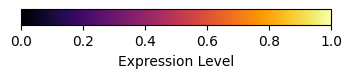

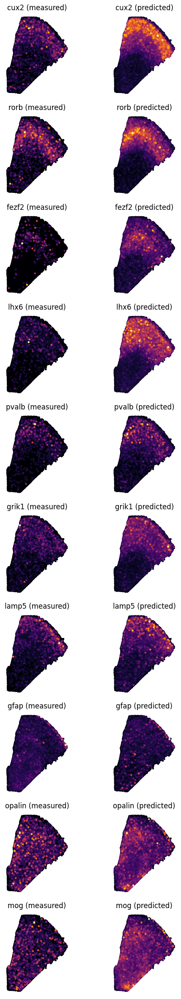

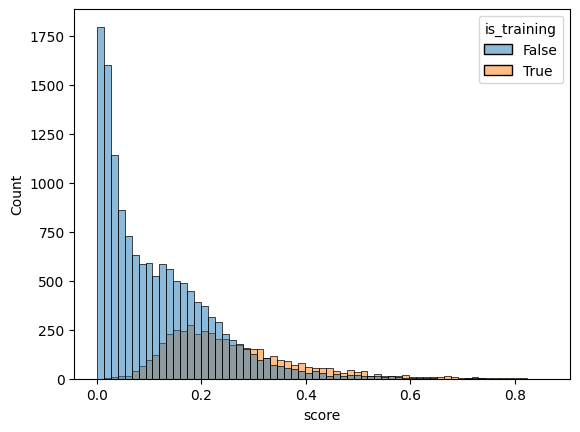

In [66]:
tg_map.compare_spatial_gene_exp()

<Figure size 640x480 with 0 Axes>

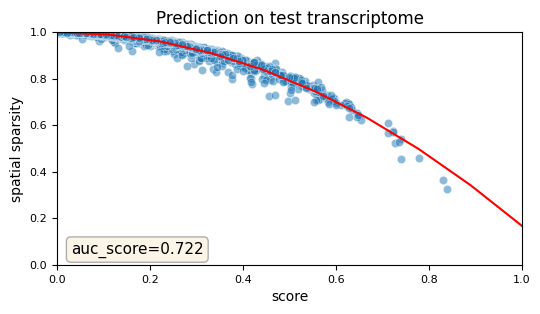

In [67]:
tg.plot_auc(tg_map.spatial_score)

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


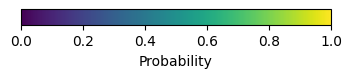

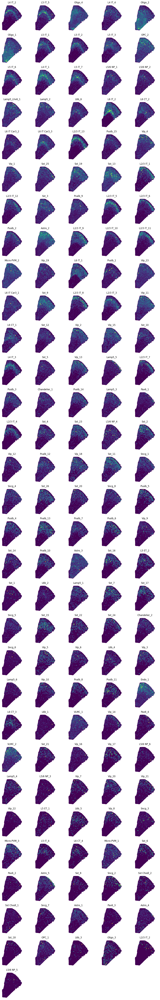

In [307]:
tg_map.plot_cell_probability()

In [308]:
tg_map.get_discrete_cell_mapping(threshold=0.1)
print(len(tg_map.ad_sp.obs))
print(len(tg_map.ad_sp.obsm['discrete_ct_pred'].dropna()))

42646
36947


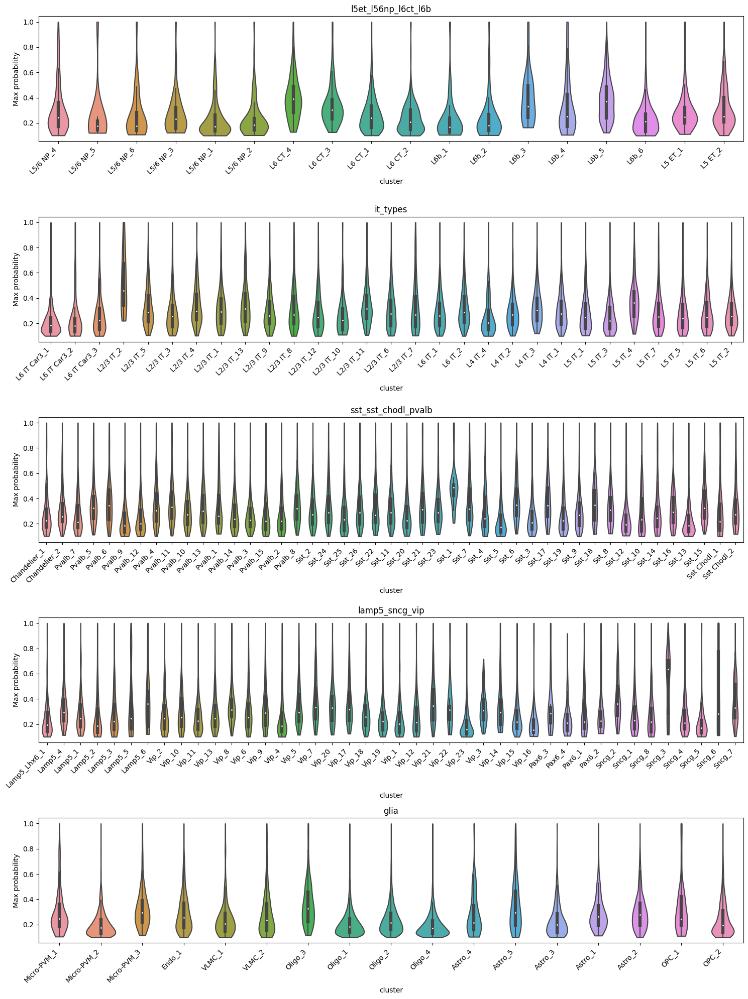

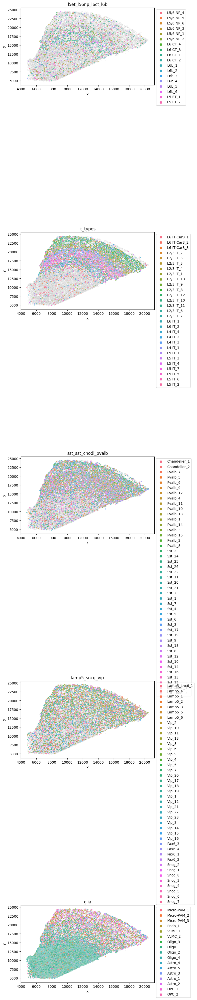

In [238]:
clusters = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood, subclasses in tg_map.ordered_labels[cls].items():
        for subclass in subclasses:
            clusters[subclass] = [cl for cl in tg_map.ordered_labels[cls][neighborhood][subclass]]

subclasses = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood in tg_map.ordered_labels[cls]:
        subclasses[neighborhood] = [subclass for subclass in tg_map.ordered_labels[cls][neighborhood]]
        
neighborhoods = {}
neighborhoods_subclass = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood in tg_map.ordered_labels[cls]:
        neighborhoods[neighborhood] = [cl for clusters in tg_map.ordered_labels[cls][neighborhood].values() for cl in clusters]
        neighborhoods_subclass[neighborhood] = [subclasses for subclasses in tg_map.ordered_labels[cls][neighborhood].keys()]

fig1 = tg_map.plot_discrete_mapping_probability(groups=neighborhoods)
fig2 = tg_map.plot_discrete_mapping(level='cluster', groups=neighborhoods)

In [59]:
marker_genes_reduced.head()

,Unnamed: 0,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene,avg_log2FC,training_gene
0,NPSR1-AS1,0.979,4.193076,0.958,4.193076,0.986,0.138,L5/6 NP_2,NPSR1-AS1,NaN,False
1,KIAA1456,0.965,8.806854,0.930,8.806854,1.000,0.697,L5/6 NP_2,KIAA1456,NaN,False
2,LOC105369818,0.958,15.499852,0.916,15.499852,0.938,0.064,L5/6 NP_2,LOC105369818,NaN,False
3,CDH6,0.953,5.515356,0.906,5.515356,0.992,0.286,L5/6 NP_2,CDH6,NaN,True
4,RANBP17,0.939,7.135565,0.878,7.135565,1.000,0.732,L5/6 NP_2,RANBP17,NaN,True


In [89]:
marker_exp = {}
marker_genes_training = marker_genes_reduced[marker_genes_reduced['training_gene']==True]
for cluster in marker_genes_reduced['cluster'].unique():
    genes = marker_genes_training[marker_genes_training['cluster']==cluster]['gene'].to_list()
    genes = [g.lower() for g in genes]
    if len(genes)==0:
        marker_exp[cluster] = 0
        continue
    cells = tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['cluster']==cluster].index
    marker_exp[cluster] = tg_map.ad_sp[cells, genes].X.mean()
marker_exp_df = pd.DataFrame.from_dict(marker_exp, orient='index', columns=['avg_training_gene_expr'])
marker_exp_df.head()

,avg_training_gene_expr
L5/6 NP_2,0.050402
L6 CT_2,0.130020
L6 CT_1,0.138837
L6b_8,NaN
L6b_5,0.065289


In [135]:
tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['cluster']=='L6b_8']

,cluster,subclass,neighborhood,class,cluster_prob,x,y


In [90]:
cluster_stats = pd.DataFrame(marker_genes_reduced.groupby('cluster')['training_gene'].sum())
cluster_stats.rename(columns={'training_gene': 'n_training_genes'}, inplace=True)
cluster_stats = cluster_stats.merge(marker_exp_df, left_index=True, right_index=True, how='outer')
cluster_stats.head()

,n_training_genes,avg_training_gene_expr
Astro_1,192,0.355762
Astro_2,211,0.484822
Astro_3,141,0.203014
Astro_4,138,0.180568
Astro_5,146,0.354690


In [91]:
# tg_map.ad_map.obs.set_index('cluster', inplace=True)
cluster_stats = cluster_stats.merge(tg_map.ad_map.obs, left_index=True, right_index=True)
cluster_stats

,n_training_genes,avg_training_gene_expr,cluster_density
Astro_1,192,0.355762,0.000900
Astro_2,211,0.484822,0.013633
Astro_3,141,0.203014,0.003654
Astro_4,138,0.180568,0.000804
Astro_5,146,0.354690,0.001186
...,...,...,...
Vip_5,8,0.201087,0.002958
Vip_6,24,0.134132,0.002822
Vip_7,13,0.229895,0.001636
Vip_8,15,0.252968,0.001459


In [92]:
cluster_stats = cluster_stats.merge(pd.DataFrame(tg_map.ad_sp.obsm['discrete_ct_pred'].groupby('cluster')['cluster_prob'].median()),
                                                 left_index=True, right_index=True)
cluster_stats

,n_training_genes,avg_training_gene_expr,cluster_density,cluster_prob
Astro_1,192,0.355762,0.000900,0.261909
Astro_2,211,0.484822,0.013633,0.277347
Astro_3,141,0.203014,0.003654,0.197926
Astro_4,138,0.180568,0.000804,0.214286
Astro_5,146,0.354690,0.001186,0.296223
...,...,...,...,...
Vip_5,8,0.201087,0.002958,0.293935
Vip_6,24,0.134132,0.002822,0.253538
Vip_7,13,0.229895,0.001636,0.331759
Vip_8,15,0.252968,0.001459,0.313036


In [94]:
cluster_stats.corr()

,n_training_genes,avg_training_gene_expr,cluster_density,cluster_prob
n_training_genes,1.000000,0.026607,0.136781,-0.103033
avg_training_gene_expr,0.026607,1.000000,0.036696,0.123130
cluster_density,0.136781,0.036696,1.000000,-0.402383
cluster_prob,-0.103033,0.123130,-0.402383,1.000000


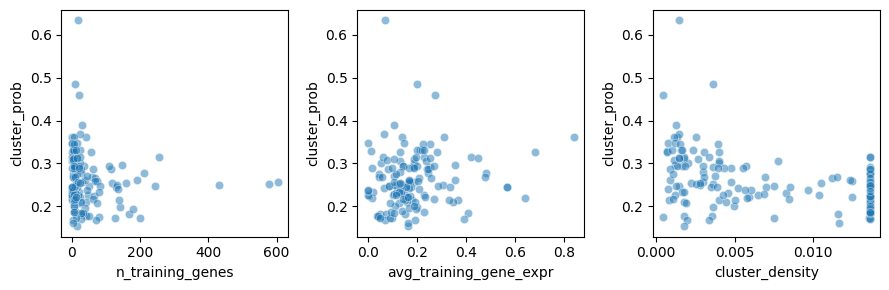

In [99]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3))

sns.scatterplot(data=cluster_stats, x='n_training_genes', y='cluster_prob', alpha=0.5, lw=0, ax=ax[0])
sns.scatterplot(data=cluster_stats, x='avg_training_gene_expr', y='cluster_prob', alpha=0.5, lw=0, ax=ax[1])
sns.scatterplot(data=cluster_stats, x='cluster_density', y='cluster_prob', alpha=0.5, lw=0, ax=ax[2])
plt.tight_layout()

Cell type ratios comparison

In [112]:
human_master_meta = pyreadr.read_r(data_path + '/human/Human_Master_metadata_for_plots_and_sharing_12_16_21.RDS')
human_master_meta = human_master_meta[None]

In [113]:
human_master_meta.set_index('sample_id', inplace=True)
print(len(human_master_meta))
human_master_meta.head()

156285


,nCount_RNA,nFeature_RNA,dataset,donor,species,tech,species_tech,neighborhood,donor_color,layer,cluster,cluster_color,cross_species_cluster,cross_species_cluster_color,sex,subclass,subclass_color,class
sample_id,,,,,,,,,,,,,,,,,,
F1S4_160106_003_A01,1423089,4466,AIBS,H200.1030,human,SSv4,human_ss,glia,#2171B5,5,Oligo_1,#88A19A,Oligo_1,#53776C,M,Oligo,#53776C,glia
F1S4_160106_037_A01,1692934,4919,AIBS,H200.1030,human,SSv4,human_ss,glia,#2171B5,1,OPC_2,#263430,OPC_2,#374A45,M,OPC,#374A45,glia
F1S4_160106_038_A01,1978968,5531,AIBS,H200.1030,human,SSv4,human_ss,glia,#2171B5,1,Astro_5,#484132,Astro_1,#665C47,M,Astro,#665C47,glia
F1S4_160106_039_A01,1761955,5658,AIBS,H200.1030,human,SSv4,human_ss,glia,#2171B5,1,Astro_5,#484132,Astro_1,#665C47,M,Astro,#665C47,glia
F1S4_160106_040_A01,1610796,6289,AIBS,H200.1030,human,SSv4,human_ss,glia,#2171B5,1,Astro_2,#7D7563,Astro_1,#665C47,M,Astro,#665C47,glia


In [161]:
clusters_meta = list(human_master_meta['cluster'].unique())
print(f'Number of clusters in metadata: {len(clusters_meta)}')
clusters_markers = list(marker_genes_df['cluster'].unique())
print(f'Number of clusters in marker gene list: {len(clusters_markers)}')
print(f'Number of unique clusters in the combined set: {len(list(set(clusters_meta + clusters_markers)))}')
print(f"Clusters in metadata that aren't in marker list:")
print([c for c in clusters_meta if c not in clusters_markers])
print(f"Clusters in marker list that aren't in metadata:")
print([c for c in clusters_markers if c not in clusters_meta])

Number of clusters in metadata: 151
Number of clusters in marker gene list: 166
Number of unique clusters in the combined set: 170
Clusters in metadata that aren't in marker list:
['Sst_3', 'Sst_2', 'Pvalb_8', 'L4 IT_4']
Clusters in marker list that aren't in metadata:
['L6b_8', 'L6 CT_5', 'L5 ET_3', 'L5/6 NP_7', 'L5/6 NP_8', 'L6b_7', 'Sncg_9', 'Pvalb_16', 'Sst_27', 'L5 IT_8', 'L2/3 IT_14', 'L6 IT Car3_4', 'Oligo_6', 'Oligo_9', 'Oligo_10', 'Oligo_8', 'Oligo_7', 'Oligo_5', 'Endo_2']


In [114]:
sc_counts_class = human_master_meta.groupby('class').count()
sc_counts_class.rename(columns={'cluster': 'n_cells'}, inplace=True)
sc_counts_class['percent'] = sc_counts_class.apply(lambda x: x['n_cells'] / sc_counts_class.sum()['n_cells'] * 100, axis=1)
sc_counts_class.drop(columns=['subclass'], inplace=True)
sc_counts_class = sc_counts_class[['n_cells', 'percent']]
sc_counts_class

,n_cells,percent
class,,
exc,95660,61.208689
glia,15022,9.611927
inh,45603,29.179384


In [115]:
sc_counts_subclass = human_master_meta.groupby(['class', 'neighborhood', 'subclass']).count()
sc_counts_subclass.rename(columns={sc_counts_subclass.iloc[:,0].name: 'n_cells'}, inplace=True)
sc_counts_subclass['percent of class'] = sc_counts_subclass.apply(lambda x: x['n_cells'] / sc_counts_class.loc[x.name[0]]['n_cells'] * 100, axis=1)
sc_counts_subclass = sc_counts_subclass.loc[~(sc_counts_subclass==0).all(axis=1)]
sc_counts_subclass.reset_index(inplace=True)
sc_counts_subclass.set_index('subclass', inplace=True)
sc_counts_subclass = sc_counts_subclass[['class', 'neighborhood', 'n_cells', 'percent of class']]
sc_counts_subclass

,class,neighborhood,n_cells,percent of class
subclass,,,,
L2/3 IT,exc,it_types,32721,34.205520
L4 IT,exc,it_types,18792,19.644575
L5 IT,exc,it_types,21431,22.403303
L6 IT,exc,it_types,7501,7.841313
L6 IT Car3,exc,it_types,4831,5.050178
L5 ET,exc,l5et_l56np_l6ct_l6b,392,0.409785
L5/6 NP,exc,l5et_l56np_l6ct_l6b,3461,3.618022
L6 CT,exc,l5et_l56np_l6ct_l6b,3116,3.257370
L6b,exc,l5et_l56np_l6ct_l6b,3415,3.569935


In [116]:
sc_counts_cluster = human_master_meta.groupby(['class', 'neighborhood', 'cluster']).count()
sc_counts_cluster.rename(columns={sc_counts_cluster.iloc[:,0].name: 'n_cells'}, inplace=True)
sc_counts_cluster['percent of class'] = sc_counts_cluster.apply(lambda x: x['n_cells'] / sc_counts_class.loc[x.name[0]]['n_cells'] * 100, axis=1)
sc_counts_cluster = sc_counts_cluster.loc[~(sc_counts_cluster==0).all(axis=1)]
sc_counts_cluster.reset_index(inplace=True)
sc_counts_cluster.set_index('cluster', inplace=True)
sc_counts_cluster = sc_counts_cluster[['class', 'neighborhood', 'n_cells', 'percent of class']]
sc_counts_cluster.head()

,class,neighborhood,n_cells,percent of class
cluster,,,,
L2/3 IT_1,exc,it_types,10932,11.427974
L2/3 IT_10,exc,it_types,2162,2.260088
L2/3 IT_11,exc,it_types,1171,1.224127
L2/3 IT_12,exc,it_types,1185,1.238762
L2/3 IT_13,exc,it_types,3935,4.113527


In [117]:
sp_counts_class = tg_map.ad_sp.obsm['discrete_ct_pred'].groupby('class').count()
sp_counts_class.rename(columns={sp_counts_class.iloc[:,0].name: 'n_cells'}, inplace=True)
sp_counts_class['percent'] = sp_counts_class.apply(lambda x: x['n_cells'] / sp_counts_class.sum()['n_cells'] * 100, axis=1)
sp_counts_class.drop(columns=['subclass'], inplace=True)
sp_counts_class = sp_counts_class[['n_cells', 'percent']]
sp_counts_class

,n_cells,percent
class,,
exc,8817,23.654558
glia,14706,39.453775
inh,13751,36.891667


In [118]:
sp_counts_subclass = tg_map.ad_sp.obsm['discrete_ct_pred'].groupby(['class', 'neighborhood', 'subclass']).count()
sp_counts_subclass.rename(columns={sp_counts_subclass.iloc[:,0].name: 'n_cells'}, inplace=True)
sp_counts_subclass['percent of class'] = sp_counts_subclass.apply(lambda x: x['n_cells'] / sp_counts_class.loc[x.name[0]]['n_cells'] * 100, axis=1)
sp_counts_subclass = sp_counts_subclass.loc[~(sp_counts_subclass==0).all(axis=1)]
sp_counts_subclass.reset_index(inplace=True)
sp_counts_subclass.set_index('subclass', inplace=True)
sp_counts_subclass = sp_counts_subclass[['class', 'neighborhood', 'n_cells', 'percent of class']]
sp_counts_subclass

,class,neighborhood,n_cells,percent of class
subclass,,,,
L2/3 IT,exc,it_types,2669,30.271067
L4 IT,exc,it_types,1104,12.521266
L5 IT,exc,it_types,1722,19.530453
L6 IT,exc,it_types,892,10.116820
L6 IT Car3,exc,it_types,551,6.249291
L5 ET,exc,l5et_l56np_l6ct_l6b,200,2.268345
L5/6 NP,exc,l5et_l56np_l6ct_l6b,508,5.761597
L6 CT,exc,l5et_l56np_l6ct_l6b,725,8.222752
L6b,exc,l5et_l56np_l6ct_l6b,446,5.058410


In [150]:
sp_counts_cluster = tg_map.ad_sp.obsm['discrete_ct_pred'].groupby(['class', 'neighborhood', 'cluster']).count()
sp_counts_cluster.rename(columns={sp_counts_cluster.iloc[:,0].name: 'n_cells'}, inplace=True)
sp_counts_cluster['percent of class'] = sp_counts_cluster.apply(lambda x: x['n_cells'] / sp_counts_class.loc[x.name[0]]['n_cells'] * 100, axis=1)
# sp_counts_cluster = sp_counts_cluster.loc[~(sp_counts_cluster==0).all(axis=1)]
sp_counts_cluster.reset_index(inplace=True)
sp_counts_cluster.set_index('cluster', inplace=True)
sp_counts_cluster = sp_counts_cluster[['class', 'neighborhood', 'n_cells', 'percent of class']]
sp_counts_cluster = sp_counts_cluster.merge(pd.DataFrame(index=sc_counts_cluster.index), left_index=True, right_index=True, how='outer')
print(len(sp_counts_cluster))
sp_counts_cluster.head()

151


,class,neighborhood,n_cells,percent of class
cluster,,,,
L2/3 IT_1,exc,it_types,263,2.982874
L2/3 IT_10,exc,it_types,59,0.669162
L2/3 IT_11,exc,it_types,202,2.291029
L2/3 IT_12,exc,it_types,154,1.746626
L2/3 IT_13,exc,it_types,322,3.652036


In [126]:
subclass_ratios = sc_counts_subclass.merge(sp_counts_subclass[['n_cells', 'percent of class']], left_index=True, right_index=True, suffixes=('_snRNAseq', '_stereoseq'))
cluster_ratios = sc_counts_cluster.merge(sp_counts_cluster[['n_cells', 'percent of class']], left_index=True, right_index=True, suffixes=('_snRNAseq', '_stereoseq'))

In [127]:
subclass_ratios[['percent of class_snRNAseq', 'percent of class_stereoseq']].corr()

,percent of class_snRNAseq,percent of class_stereoseq
percent of class_snRNAseq,1.000000,0.924601
percent of class_stereoseq,0.924601,1.000000


In [128]:
cluster_ratios[['percent of class_snRNAseq', 'percent of class_stereoseq']].corr()

,percent of class_snRNAseq,percent of class_stereoseq
percent of class_snRNAseq,1.000000,0.614551
percent of class_stereoseq,0.614551,1.000000


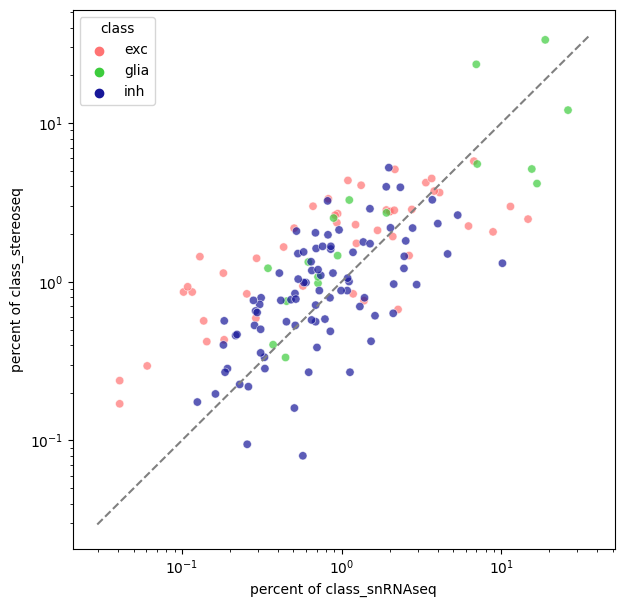

In [130]:
fig, ax = plt.subplots(figsize=(7,7))
sns.scatterplot(data=cluster_ratios, x='percent of class_snRNAseq', y='percent of class_stereoseq', hue='class', 
               palette=tg_map.ordered_labels['class'], ax=ax, alpha=0.7)
ax.set_xscale('log')
ax.set_yscale('log')
abline(1, 0, ax=ax, args={'ls': '--', 'c': 'grey'})

In [371]:
l6it_car3_sp = tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['subclass']=='L6 IT Car3']
l6it_car3_sp = l6it_car3_sp.merge(tg_map.ad_sp.to_df()['cux2'], left_index=True, right_index=True)
l6it_car3_sc = tg_map.ad_sc.obs[tg_map.ad_sc.obs['subclass']=='L6 IT Car3']
l6it_car3_sc = l6it_car3_sc.merge(tg_map.ad_sc.to_df()['cux2'], left_index=True, right_index=True)

In [380]:
l6it_car3_sc['cluster'].unique()

['L6 IT Car3_1', 'L6 IT Car3_2', 'L6 IT Car3_3']
Categories (151, object): ['Astro_1', 'Astro_2', 'Astro_3', 'Astro_4', ..., 'Vip_20', 'Vip_21', 'Vip_22', 'Vip_23']

Text(0.5, 1.0, 'snRNAseq')

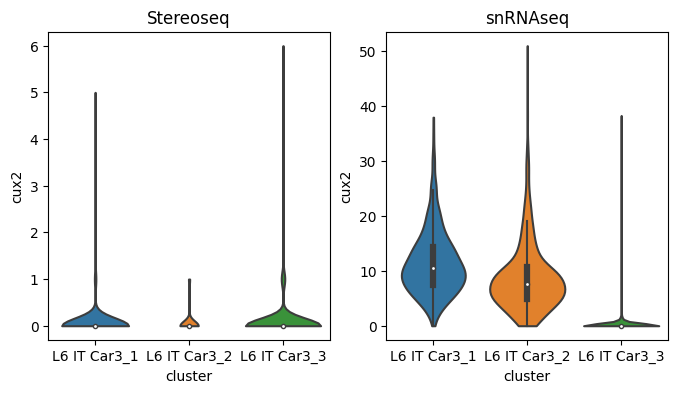

In [409]:
fig, ax  = plt.subplots(1, 2, figsize=(8, 4))
sns.violinplot(data=l6it_car3_sp, x='cluster', y='cux2', cut=0, ax=ax[0], order=['L6 IT Car3_1', 'L6 IT Car3_2', 'L6 IT Car3_3'],
              scale='count')
ax[0].set_title('Stereoseq')
sns.violinplot(data=l6it_car3_sc, x='cluster', y='cux2', cut=0, ax=ax[1], order=['L6 IT Car3_1', 'L6 IT Car3_2', 'L6 IT Car3_3'],
              scale='count')
ax[1].set_title('snRNAseq')

Correlation of training genes by cluster

In [44]:
marker_genes_reduced.head()

,Unnamed: 0,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene,avg_log2FC
0,NPSR1-AS1,0.979,4.193076,0.958,4.193076,0.986,0.138,L5/6 NP_2,NPSR1-AS1,NaN
1,KIAA1456,0.965,8.806854,0.930,8.806854,1.000,0.697,L5/6 NP_2,KIAA1456,NaN
2,LOC105369818,0.958,15.499852,0.916,15.499852,0.938,0.064,L5/6 NP_2,LOC105369818,NaN
3,CDH6,0.953,5.515356,0.906,5.515356,0.992,0.286,L5/6 NP_2,CDH6,NaN
4,RANBP17,0.939,7.135565,0.878,7.135565,1.000,0.732,L5/6 NP_2,RANBP17,NaN


In [79]:
cluster_corr = {}

clusters = tg_map.ad_sc.obs['cluster'].unique().to_list()
for cluster in clusters:
    marker_genes = marker_genes_reduced[marker_genes_reduced['cluster']==cluster]['gene'].to_list()
    marker_genes = [g.lower() for g in marker_genes if g.lower() in tg_map.ad_sp.uns['training_genes']]
    if len(marker_genes) == 0:
        continue
    ad_sp_cells = tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['cluster']==cluster].index
    ad_sp_exp = tg_map.ad_sp[ad_sp_cells, marker_genes]
    ad_sc_cells = tg_map.ad_sc.obs[tg_map.ad_sc.obs['cluster']==cluster].index
    ad_sc_exp = tg_map.ad_sc[ad_sc_cells, marker_genes]
    corr, pval = spearmanr(np.log(ad_sp_exp.X.mean(axis=0)), np.log(ad_sc_exp.X.mean(axis=0)))
    cluster_corr[cluster] = {'corr': corr, 'pval': pval, 'n_training_genes': len(marker_genes)}

In [87]:
cluster_corr_df = pd.DataFrame(cluster_corr).T
cluster_corr_df = cluster_corr_df.merge(sp_counts_cluster[['class', 'neighborhood']], left_index=True, right_index=True)
cluster_corr_df.head()

,corr,pval,n_training_genes,class,neighborhood
Micro-PVM_1,0.237199,0.030840,83.0,glia,glia
Micro-PVM_2,0.353092,0.000043,128.0,glia,glia
Micro-PVM_3,0.277947,0.003430,109.0,glia,glia
Endo_1,0.283086,0.001984,117.0,glia,glia
VLMC_1,0.311379,0.006542,75.0,glia,glia


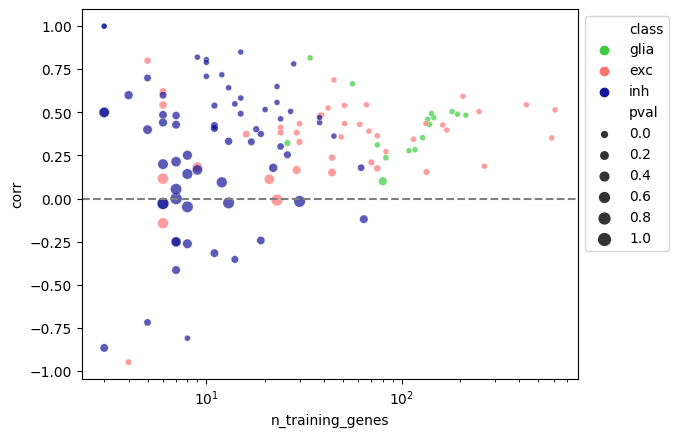

In [93]:
fig, ax = plt.subplots()
sns.scatterplot(data=cluster_corr_df, x='n_training_genes', y='corr', hue='class', palette=tg_map.ordered_labels['class'],
               alpha=0.7, size='pval')
ax.set_xscale('log')
ax.legend(bbox_to_anchor=(1,1))
ax.axhline(0, ls='--', c='grey')

In [35]:
clusters = tg_map.ad_sc.obs['cluster'].unique().to_list()
cluster_corr_matrix = np.empty((len(clusters), len(clusters)), dtype=float)
genes = tg_map.ad_sp.uns['training_genes']

for i, cluster1 in enumerate(clusters):
    ad_sp_cells = tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['cluster']==cluster1].index
    ad_sp_exp = tg_map.ad_sp[ad_sp_cells, genes]
    for j, cluster2 in enumerate(clusters):
        ad_sc_cells = tg_map.ad_sc.obs[tg_map.ad_sc.obs['cluster']==cluster2].index
        ad_sc_exp = tg_map.ad_sc[ad_sc_cells, genes]
        
        corr, pval = spearmanr(ad_sp_exp.X.mean(axis=0), ad_sc_exp.X.mean(axis=0))
        cluster_corr_matrix[i, j] = corr

In [36]:
cluster_corr_matrix_df = pd.DataFrame(cluster_corr_matrix, index=clusters, columns=clusters)
cluster_corr_matrix_df.head()

,Micro-PVM_1,Micro-PVM_2,Micro-PVM_3,Endo_1,VLMC_1,VLMC_2,Oligo_3,Oligo_1,Oligo_2,Oligo_4,...,Lamp5_5,Lamp5_6,Sncg_2,Sncg_1,Sncg_8,Sncg_3,Sncg_4,Sncg_5,Sncg_6,Sncg_7
Micro-PVM_1,0.365354,0.377048,0.374724,0.352357,0.325502,0.397495,0.454305,0.482090,0.485725,0.511984,...,0.537105,0.522024,0.540894,0.528634,0.520191,0.526165,0.509510,0.516539,0.530852,0.506178
Micro-PVM_2,0.421959,0.466477,0.461516,0.383078,0.354077,0.432482,0.480247,0.512401,0.514253,0.539232,...,0.550329,0.534664,0.552741,0.541004,0.532327,0.541573,0.525366,0.531267,0.547245,0.521521
Micro-PVM_3,0.363124,0.398889,0.396767,0.341718,0.307973,0.393862,0.425277,0.452157,0.455166,0.479372,...,0.521360,0.506311,0.523883,0.512777,0.502432,0.511954,0.495925,0.504493,0.520452,0.493070
Endo_1,0.331780,0.350587,0.350936,0.439648,0.325335,0.436759,0.424168,0.446299,0.449870,0.476865,...,0.531374,0.515197,0.532519,0.520752,0.512406,0.519817,0.504669,0.513346,0.524171,0.500003
VLMC_1,0.339433,0.359170,0.356627,0.368138,0.355981,0.430109,0.452892,0.482020,0.484651,0.509280,...,0.536761,0.518209,0.531535,0.521303,0.513394,0.523510,0.508795,0.514113,0.525368,0.503276


In [163]:
human_merscope = anndata.read_h5ad(data_path + '/human/Great_apes_72722_annotated_with_depth.h5ad')

In [176]:
human_merscope.obs['x'] = human_merscope.obsm['spatial'][:, 0]
human_merscope.obs['y'] = human_merscope.obsm['spatial'][:, 1]

In [177]:
human_merscope_section = human_merscope[human_merscope.obs['section']=='H19.30.001.Cx46.MTG2.02.007.03']

In [178]:
human_merscope_section.obs.head()

,cluster,subclass,neighborhood,class,merscope,avg.cor,genes_detected,total_reads,prob,volume,section,filename,napari_x,napari_y,selected_cells,depth_coordinate,normalized_depth,x,y
311899265525804364043972895419228225536,Astro_5,Astro,glia,glia,early merscope,0.206263,27.0,38.0,0.86,1474.554208,H19.30.001.Cx46.MTG2.02.007.03,202112021529_H1930001Cx46MTG202007203_VMSC01001,-8505.780589,992.057768,False,-1.0,-0.1,992.057768,8505.780589
69679171148257952179749542001121427456,Oligo_3,Oligo,glia,glia,early merscope,0.139390,23.0,72.0,0.25,463.687764,H19.30.001.Cx46.MTG2.02.007.03,202112021529_H1930001Cx46MTG202007203_VMSC01001,-8588.616591,999.131768,False,-1.0,-0.1,999.131768,8588.616591
239833157268374065721939574161137467392,Lamp5_1,Lamp5,lamp5_sncg_vip,inh,early merscope,0.145215,13.0,39.0,0.33,166.395717,H19.30.001.Cx46.MTG2.02.007.03,202112021529_H1930001Cx46MTG202007203_VMSC01001,-8520.260041,2571.521726,False,-1.0,-0.1,2571.521726,8520.260041
171122132958009907927092138959567847424,Lamp5_1,Lamp5,lamp5_sncg_vip,inh,early merscope,0.168737,18.0,208.0,0.26,559.898273,H19.30.001.Cx46.MTG2.02.007.03,202112021529_H1930001Cx46MTG202007203_VMSC01001,-8459.963227,3139.413759,False,-1.0,-0.1,3139.413759,8459.963227
129103549955172881216715439196990341120,Oligo_1,Oligo,glia,glia,early merscope,0.138320,36.0,177.0,0.67,439.377071,H19.30.001.Cx46.MTG2.02.007.03,202112021529_H1930001Cx46MTG202007203_VMSC01001,-8530.921674,3370.526211,False,-1.0,-0.1,3370.526211,8530.921674


In [203]:
tg_map_bin100 = TangramMapping.load_from_timestamp(directory=data_path + '/BGI_data/903TR_C4/mapping', timestamp='1676568816.650')

In [204]:
tg_map_bin100.get_discrete_cell_mapping(threshold=0.1)

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


In [223]:
tg_map_bin50 = TangramMapping.load_from_timestamp(directory=data_path + '/BGI_data/903TR_C4/mapping', timestamp='1677541944.367')

In [224]:
tg_map_bin50.get_discrete_cell_mapping(threshold=0.1)

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


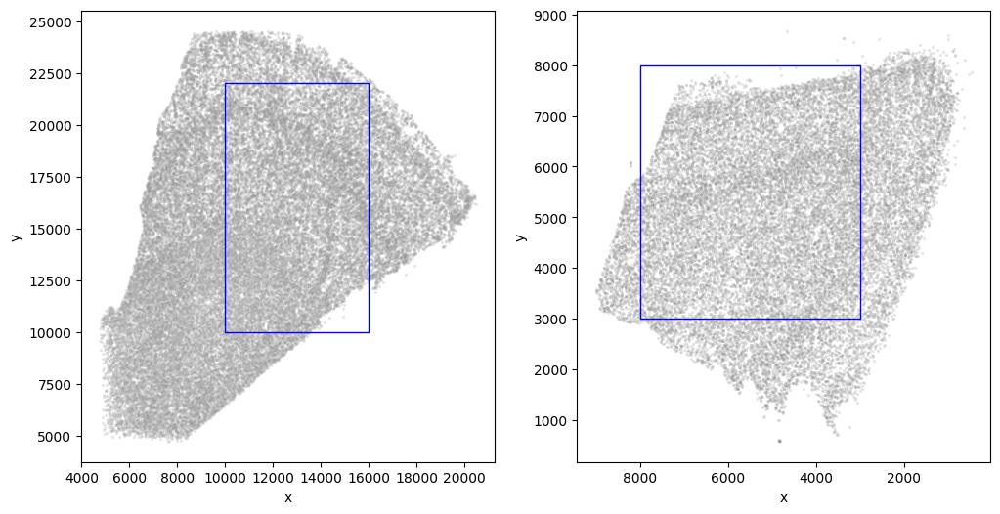

In [256]:
def plot_rect(xlim, ylim, ax, color):
    import matplotlib.patches
    pos = (xlim[0], ylim[0])
    width = xlim[1] - xlim[0]
    height = ylim[1] - ylim[0]
    rect = matplotlib.patches.Rectangle(pos, width, height, linewidth=1, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
    return rect

fig, ax = plt.subplots(1, 2, figsize=(12,6))
sns.scatterplot(data=tg_map.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=5, ax=ax[0])
# plot_rect((12000, 20000), (10000, 25000), ax[0], 'r')
plot_rect((10000, 16000), (10000, 22000), ax[0], 'b')
sns.scatterplot(data=human_merscope_section.obs, x='x', y='y', color='grey', alpha=0.2, s=5, ax=ax[1])
ax[1].invert_xaxis()
# plot_rect((3000, 6000), (5500, 8000), ax[1], 'r')
plot_rect((3000, 8000), (3000, 8000), ax[1], 'b')

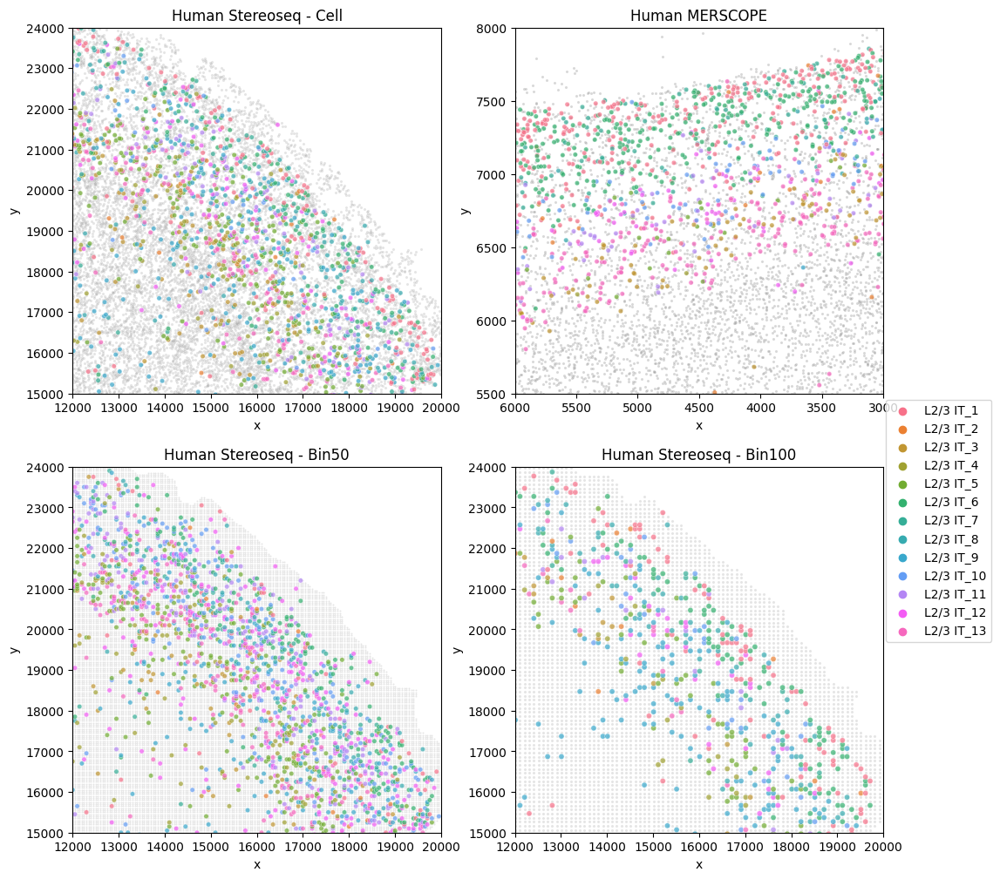

In [237]:
fig, ax = plt.subplots(2, 2, figsize=(12,12))
sns.scatterplot(data=tg_map.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=5, ax=ax[0,0])
sns.scatterplot(data=tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['subclass']=='L2/3 IT'], 
                x='x', y='y', hue='cluster', alpha=0.7, s=15, legend=False,
                hue_order=[f'L2/3 IT_{x}' for x in range(1, 14)], ax=ax[0,0])
ax[0,0].set_title('Human Stereoseq - Cell')
ax[0,0].set_xlim(12000, 20000)
ax[0,0].set_ylim(15000, 24000)

sns.scatterplot(data=tg_map_bin50.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=2, ax=ax[1,0])
sns.scatterplot(data=tg_map_bin50.ad_sp.obsm['discrete_ct_pred'][tg_map_bin50.ad_sp.obsm['discrete_ct_pred']['subclass']=='L2/3 IT'], 
                x='x', y='y', hue='cluster', alpha=0.7, s=15, legend=False,
                hue_order=[f'L2/3 IT_{x}' for x in range(1, 14)], ax=ax[1,0])
ax[1,0].set_title('Human Stereoseq - Bin50')
ax[1,0].set_xlim(12000, 20000)
ax[1,0].set_ylim(15000, 24000)

sns.scatterplot(data=tg_map_bin100.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=5, ax=ax[1,1])
sns.scatterplot(data=tg_map_bin100.ad_sp.obsm['discrete_ct_pred'][tg_map_bin100.ad_sp.obsm['discrete_ct_pred']['subclass']=='L2/3 IT'], 
                x='x', y='y', hue='cluster', alpha=0.7, s=20, legend=False,
                hue_order=[f'L2/3 IT_{x}' for x in range(1, 14)], ax=ax[1,1])
ax[1,1].set_title('Human Stereoseq - Bin100')
ax[1,1].set_xlim(12000, 20000)
ax[1,1].set_ylim(15000, 24000)

sns.scatterplot(data=human_merscope_section.obs, x='x', y='y', color='grey', s=5, alpha=0.3, ax=ax[0,1])
sns.scatterplot(data=human_merscope_section.obs[human_merscope_section.obs['subclass']=='L2/3 IT'], 
                x='x', y='y', hue='cluster', alpha=0.7, s=15,
                hue_order=[f'L2/3 IT_{x}' for x in range(1, 14)], ax=ax[0,1])
ax[0,1].set_title('Human MERSCOPE')
ax[0,1].legend(bbox_to_anchor=(1.15,0))
ax[0,1].set_xlim(3000, 6000)
ax[0,1].set_ylim(5500, 8000)
ax[0,1].invert_xaxis()

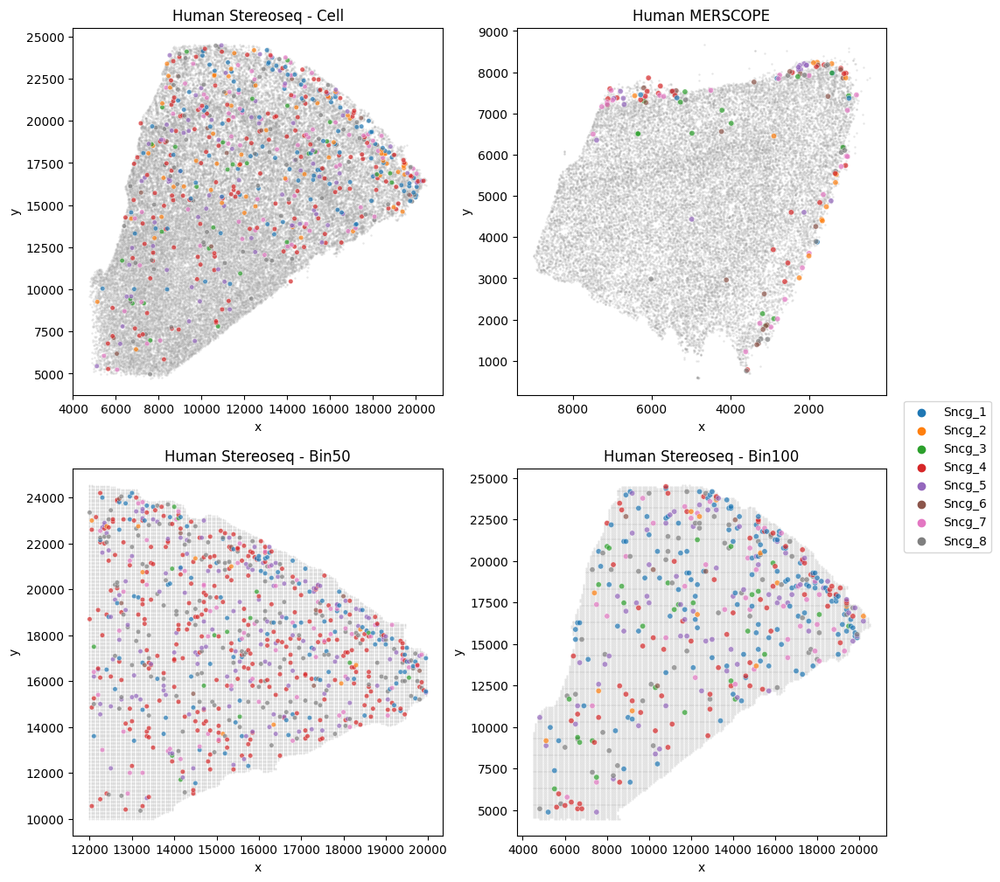

In [252]:
subclass = 'Sncg'
n_clusters = len(tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass]['cluster'].unique()) + 1
fig, ax = plt.subplots(2, 2, figsize=(12,12))
sns.scatterplot(data=tg_map.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=3, ax=ax[0,0])
sns.scatterplot(data=tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=15, legend=False,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[0,0])
ax[0,0].set_title('Human Stereoseq - Cell')
# ax[0,0].set_xlim(12000, 20000)
# ax[0,0].set_ylim(15000, 24000)

sns.scatterplot(data=tg_map_bin50.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=2, ax=ax[1,0])
sns.scatterplot(data=tg_map_bin50.ad_sp.obsm['discrete_ct_pred'][tg_map_bin50.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=15, legend=False,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[1,0])
ax[1,0].set_title('Human Stereoseq - Bin50')
# ax[1,0].set_xlim(12000, 20000)
# ax[1,0].set_ylim(15000, 24000)

sns.scatterplot(data=tg_map_bin100.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=3, ax=ax[1,1])
sns.scatterplot(data=tg_map_bin100.ad_sp.obsm['discrete_ct_pred'][tg_map_bin100.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=20, legend=False,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[1,1])
ax[1,1].set_title('Human Stereoseq - Bin100')
# ax[1,0].set_xlim(12000, 20000)
# ax[1,0].set_ylim(15000, 24000)

sns.scatterplot(data=human_merscope_section.obs, x='x', y='y', color='grey', s=3, alpha=0.2, ax=ax[0,1])
sns.scatterplot(data=human_merscope_section.obs[human_merscope_section.obs['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=20,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[0,1])
ax[0,1].set_title('Human MERSCOPE')
ax[0,1].legend(bbox_to_anchor=(1.3,0))
# ax[0,1].set_xlim(3000, 6000)
# ax[0,1].set_ylim(5500, 8000)
ax[0,1].invert_xaxis()

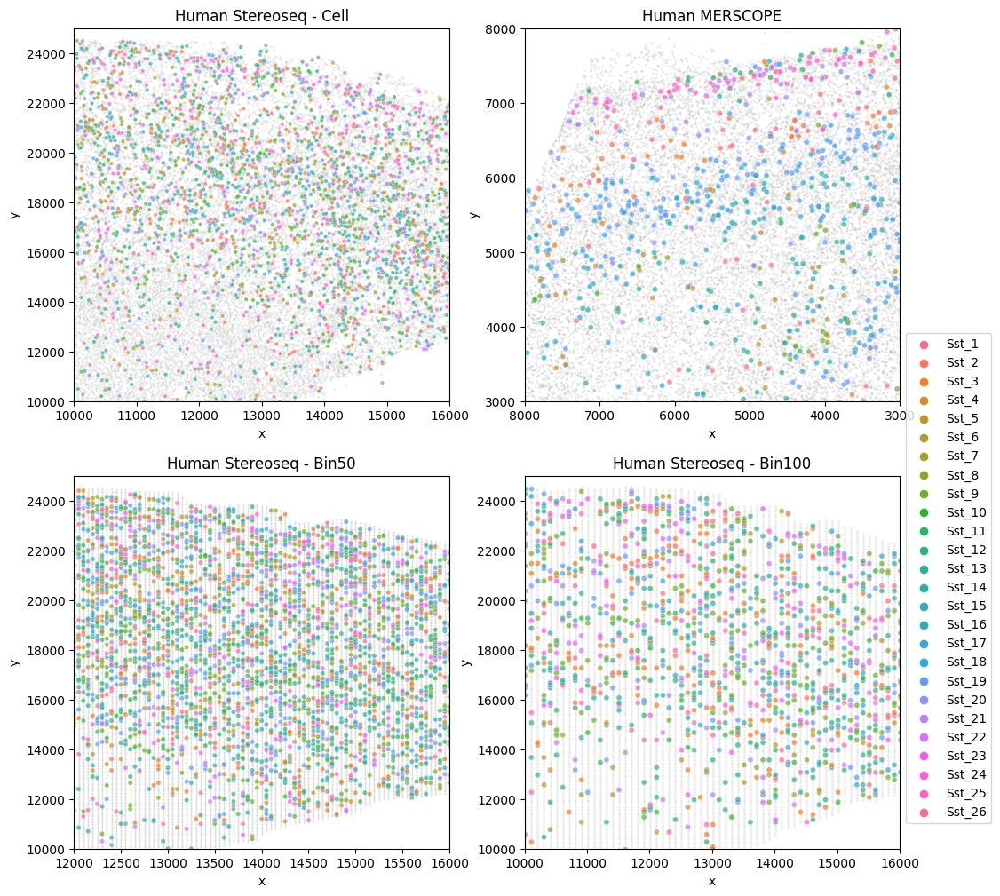

In [255]:
subclass = 'Sst'
n_clusters = len(tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass]['cluster'].unique()) + 1
fig, ax = plt.subplots(2, 2, figsize=(12,12))
sns.scatterplot(data=tg_map.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=3, ax=ax[0,0])
sns.scatterplot(data=tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=10, legend=False,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[0,0])
ax[0,0].set_title('Human Stereoseq - Cell')
ax[0,0].set_xlim(10000, 16000)
ax[0,0].set_ylim(10000, 25000)

sns.scatterplot(data=tg_map_bin50.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=2, ax=ax[1,0])
sns.scatterplot(data=tg_map_bin50.ad_sp.obsm['discrete_ct_pred'][tg_map_bin50.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=15, legend=False,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[1,0])
ax[1,0].set_title('Human Stereoseq - Bin50')
ax[1,0].set_xlim(12000, 16000)
ax[1,0].set_ylim(10000, 25000)

sns.scatterplot(data=tg_map_bin100.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=3, ax=ax[1,1])
sns.scatterplot(data=tg_map_bin100.ad_sp.obsm['discrete_ct_pred'][tg_map_bin100.ad_sp.obsm['discrete_ct_pred']['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=20, legend=False,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[1,1])
ax[1,1].set_title('Human Stereoseq - Bin100')
ax[1,1].set_xlim(10000, 16000)
ax[1,1].set_ylim(10000, 25000)

sns.scatterplot(data=human_merscope_section.obs, x='x', y='y', color='grey', s=3, alpha=0.2, ax=ax[0,1])
sns.scatterplot(data=human_merscope_section.obs[human_merscope_section.obs['subclass']==subclass], 
                x='x', y='y', hue='cluster', alpha=0.7, s=20,
                hue_order=[f'{subclass}_{x}' for x in range(1, n_clusters)], ax=ax[0,1])
ax[0,1].set_title('Human MERSCOPE')
ax[0,1].legend(bbox_to_anchor=(1,0.2))
ax[0,1].set_xlim(3000, 8000)
ax[0,1].set_ylim(3000, 8000)
ax[0,1].invert_xaxis()